# #Apply ML algorithms##
--Linear Regression
--Lasso Regression
--Decision Tree Regressor
--KNN Regressor
--RandomForestRegressor
--Xgbost Regressor
--Hyperparameter Tuning
--ANN-Artificial Neural Network

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv('Data/Real-Data/Real_Combine.csv')

In [3]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


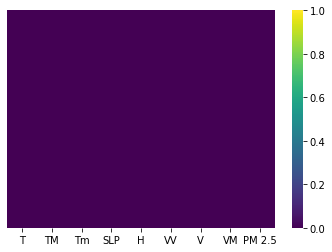

In [4]:
#Check for null values
sns.heatmap(df.isnull(),yticklabels=False,cbar=True,cmap='viridis')

In [5]:
df.isnull() #CHeck Null values..if its True..its null

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...
726,False,False,False,False,False,False,False,False,False
727,False,False,False,False,False,False,False,False,False
728,False,False,False,False,False,False,False,False,False
729,False,False,False,False,False,False,False,False,False


In [6]:
df=df.dropna() #Drop null values

In [7]:
#Decide features
X=df.iloc[:,:-1] ## Taking all indepedent features
y=df.iloc[:,-1] #Dependent feature

In [8]:
X.isnull()

,T,TM,Tm,SLP,H,VV,V,VM
0,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...
726,False,False,False,False,False,False,False,False
727,False,False,False,False,False,False,False,False
728,False,False,False,False,False,False,False,False
729,False,False,False,False,False,False,False,False


In [9]:
y.isnull()

0      False
1      False
2      False
3      False
4      False
       ...  
726    False
727    False
728    False
729    False
730    False
Name: PM 2.5, Length: 730, dtype: bool

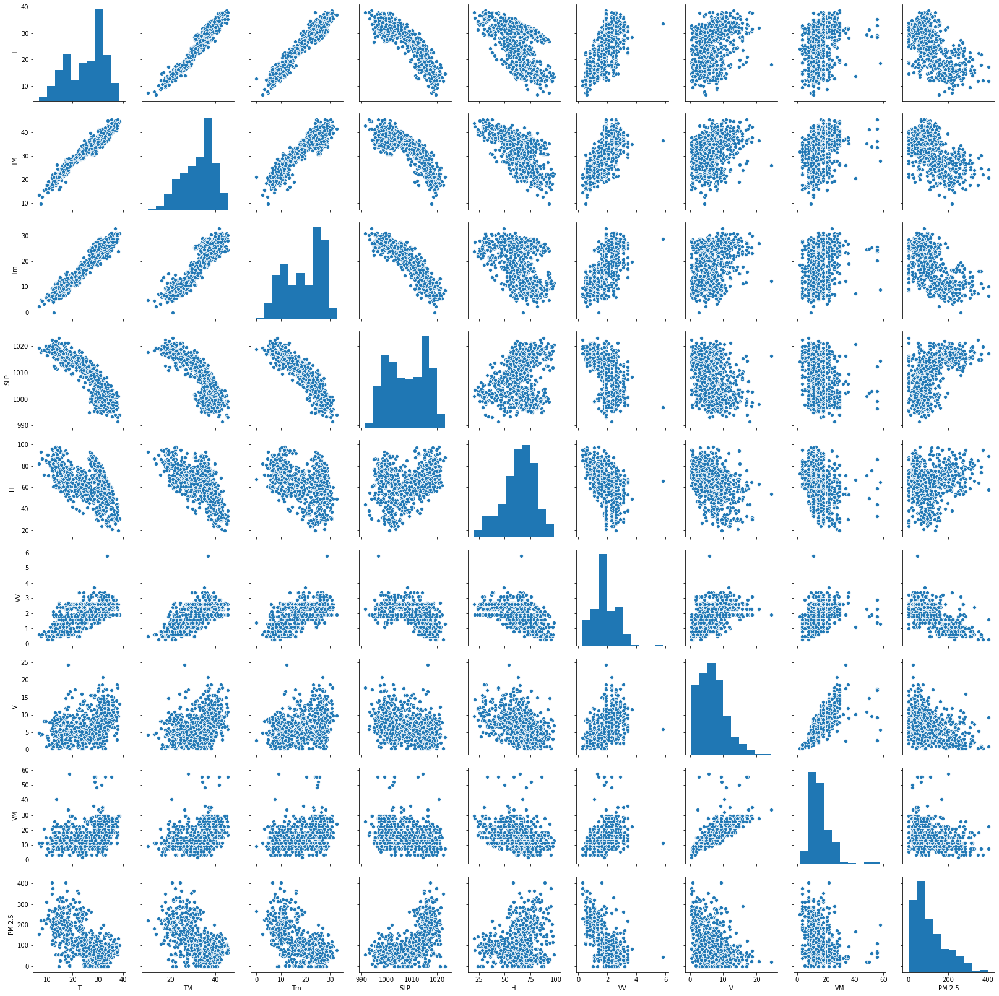

In [11]:
sns.pairplot(df) #Multivarient (compare various features with other)..all indipendent and dependent features

In [12]:
df.corr() #co relation

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967276,0.958892,-0.884383,-0.518870,0.622637,0.326067,0.287138,-0.628336
TM,0.967276,1.000000,0.896699,-0.829254,-0.599629,0.598479,0.320116,0.299508,-0.569381
Tm,0.958892,0.896699,1.000000,-0.909514,-0.315305,0.560299,0.312904,0.259431,-0.669059
SLP,-0.884383,-0.829254,-0.909514,1.000000,0.274196,-0.491842,-0.346130,-0.299830,0.615615
H,-0.518870,-0.599629,-0.315305,0.274196,1.000000,-0.475279,-0.399079,-0.370981,0.174658
VV,0.622637,0.598479,0.560299,-0.491842,-0.475279,1.000000,0.402884,0.347493,-0.628621
V,0.326067,0.320116,0.312904,-0.346130,-0.399079,0.402884,1.000000,0.760777,-0.354799
VM,0.287138,0.299508,0.259431,-0.299830,-0.370981,0.347493,0.760777,1.000000,-0.283695
PM 2.5,-0.628336,-0.569381,-0.669059,0.615615,0.174658,-0.628621,-0.354799,-0.283695,1.000000


# Correlation matrix with heatmap
Corelation States how the features are related to each other or the target variable. 

Correlation can be positive (increase in one value of feature increases the value of the target variable ) or negative (increase in one value of feature decreases the valueof the target variable)

Heatmap makes it easy to identify which features are most related to the target variable. we will plot heatmap of correlated features using the seaborn library. 

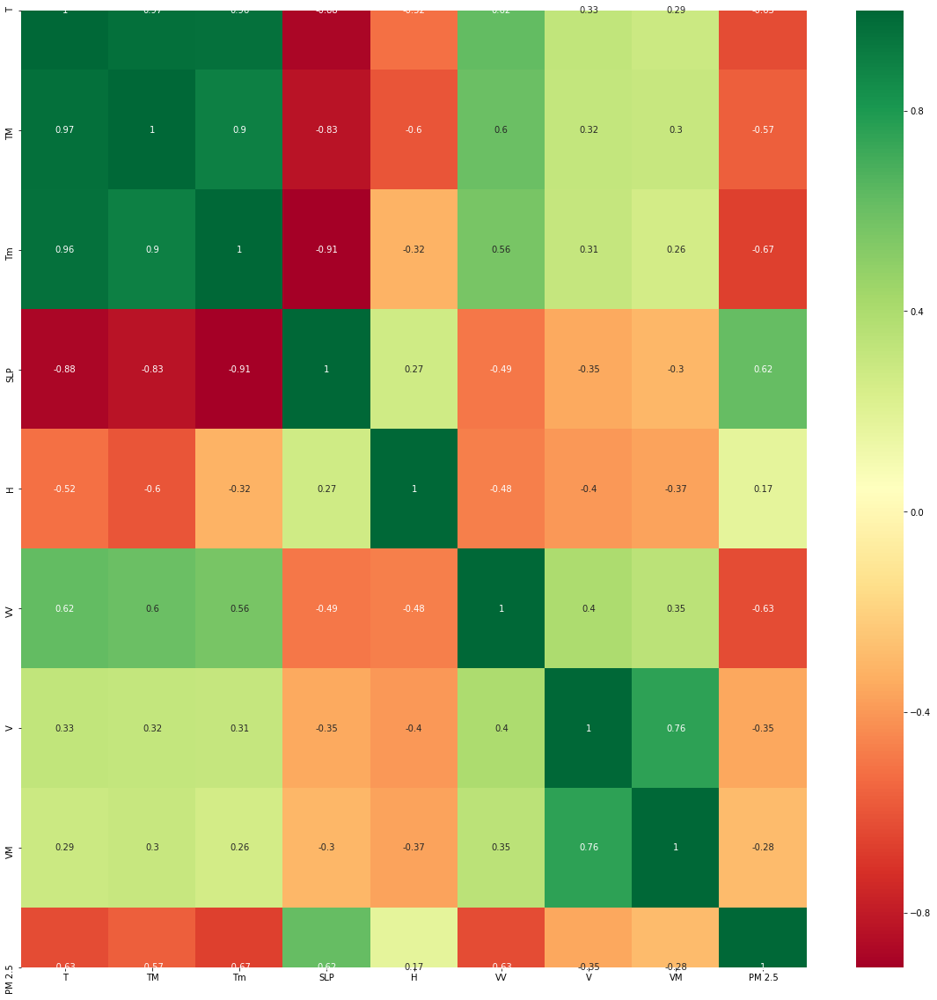

In [13]:
#Another way of getting corelation of each features in dataset like heatmap
import seaborn as sns
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [14]:
corrmat.index

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

# Feature Importance
You can get the feature importance of each feature of your dataset by using the feature importance property of the model. 

Feature importance gives you a score for each feature of your data, the higher the score is more important or relevant is the feature towards your output variable. 

Feature importance is an inbuild class that coes with Tree based Regressor, we will be using Extra Tree Regressor for extracting the top 10 features for the dataset. 

In [15]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model = ExtraTreesRegressor()  #intialize extratreeregressor
model.fit(X,y)   #save it in model

ExtraTreesRegressor(bootstrap=False, ccp_alpha=0.0, criterion='mse',
                    max_depth=None, max_features='auto', max_leaf_nodes=None,
                    max_samples=None, min_impurity_decrease=0.0,
                    min_impurity_split=None, min_samples_leaf=1,
                    min_samples_split=2, min_weight_fraction_leaf=0.0,
                    n_estimators=100, n_jobs=None, oob_score=False,
                    random_state=None, verbose=0, warm_start=False)

In [16]:
print(model.feature_importances_) #Imp of top features

[0.1662517  0.07867584 0.19284654 0.12139284 0.08644158 0.26591749
 0.05119514 0.03727888]


In [17]:
X.head()  # check which important feature represents what value in X inputs

,T,TM,Tm,SLP,H,VV,V,VM
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2


<function matplotlib.pyplot.show(*args, **kw)>

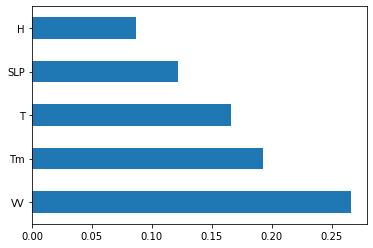

In [18]:
#plot Graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show

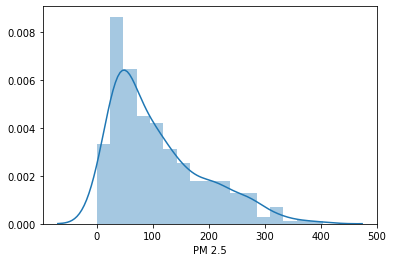

In [19]:
sns.distplot(y) #to see th plot for dependent feature..(right skewed dist graph....may be Gaussian distribution ??
#..this probably has to be normalized using the log function...

# Decision Tree Regressor

In [20]:
#Train and Test Split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

In [21]:
from sklearn.tree import DecisionTreeRegressor

In [22]:
dtree=DecisionTreeRegressor(criterion="mse")

In [23]:
dtree.fit(X_train,y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [24]:
print("CoEfficient of determination of R^2 <-- on train set: {}".format(dtree.score(X_train, y_train)))

CoEfficient of determination of R^2 <-- on train set: 1.0


In [25]:
print("CoEfficient of determination of R^2 <-- on test set: {}".format(dtree.score(X_test, y_test)))

CoEfficient of determination of R^2 <-- on test set: 0.2716922344824917


In [26]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(dtree,X,y,cv=5)

In [27]:
score.mean()

0.11419405542035148

# Tree Visualization

Scikit learn actually has some built-in visulization capabilities for decision trees, you wont use this often and it requires you to install and pydot library, but here is an example of what it looks like and the code to execute this. 

In [28]:
from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

C:\Users\mohan\.conda\envs\ML_Practice\lib\site-packages\sklearn\externals\six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [29]:
features = list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [30]:
import os
os.environ['PATH'] = os.environ['PATH']+';' +os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

In [31]:
dot_data = StringIO()
export_graphviz(dtree, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

# Model Evaluation

In [33]:
#assigning decission model to prediction for graph
prediction=dtree.predict(X_test)

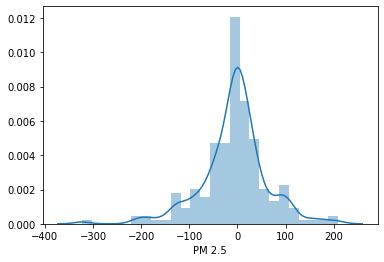

In [40]:
sns.distplot(y_test-prediction) #plotting graph

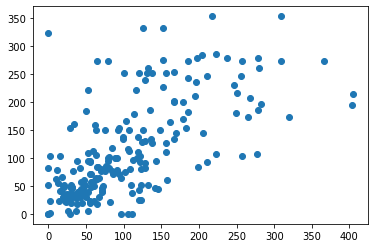

In [41]:
plt.scatter(y_test,prediction)

# Hyperparameter Tuning Decision Tree Regressor

In [42]:
DecisionTreeRegressor()

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [55]:
#Hyper Parameter Optimization
params={
    "splitter" :["best","random"],
    "max_depth" :[3,4,5,6,7,10,12,15],
    "min_samples_leaf" :[1,2,3,4,5],
    "min_weight_fraction_leaf":[0.1,0.2,0.3,0.4],
    "max_features" :["auto","log2","sqrt",None],
    "max_leaf_nodes":[None,10,20,30,40,50,60,70]
}

In [56]:
#Hyperparameter optimization using GridSearchCV
from sklearn.model_selection import GridSearchCV

In [57]:
random_search=GridSearchCV(dtree,param_grid=params,scoring='neg_mean_squared_error', n_jobs=-1,cv=10,verbose=3)

In [58]:
#Timer function - validate time consume for random_search to complete
def timer(start_time=None):
    if not start_time:
        return start_time
    elif start_time:
        thour, temp_sec = devmod((datetime.now() - start_time).total_seconds(),3600)
        tmin,tsec = divmod(temp_sec, 60)
        print('\n Time taken: %1 hours %1 minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [60]:
from datetime import datetime
start_time = timer(None) 
random_search.fit(X,y)
timer(start_time)

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    0.0s
[Parallel(n_jobs=-1)]: Done 224 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done 864 tasks      | elapsed:    2.4s
[Parallel(n_jobs=-1)]: Done 1760 tasks      | elapsed:    4.5s
[Parallel(n_jobs=-1)]: Done 2912 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done 4320 tasks      | elapsed:   10.5s
[Parallel(n_jobs=-1)]: Done 5984 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done 7904 tasks      | elapsed:   19.0s
[Parallel(n_jobs=-1)]: Done 10080 tasks      | elapsed:   24.1s
[Parallel(n_jobs=-1)]: Done 12512 tasks      | elapsed:   29.8s
[Parallel(n_jobs=-1)]: Done 15200 tasks      | elapsed:   36.0s
[Parallel(n_jobs=-1)]: Done 18144 tasks      | elapsed:   43.0s
[Parallel(n_jobs=-1)]: Done 23104 tasks      | elapsed:   52.9s
[Parallel(n_jobs=-1)]: Done 30016 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 37440 task

In [62]:
random_search.best_params_

{'max_depth': 7,
 'max_features': 'auto',
 'max_leaf_nodes': 70,
 'min_samples_leaf': 5,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'random'}

In [63]:
random_search.best_score_

-3210.9626545198657

In [65]:
predictions=random_search.predict(X_test)

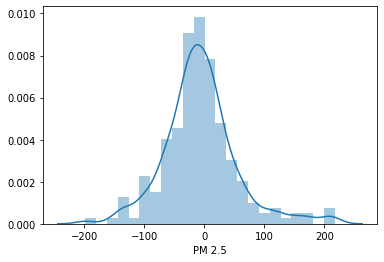

In [66]:
sns.distplot(y_test-predictions)

In [70]:
from sklearn import metrics
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 44.654108322326294
MSE: 3847.7303009165184
RMSE: 62.03007577713023


In [74]:
import pickle
file = open('decision_regression_model.pkl', 'wb')
pickle.dump(random_search, file)